# Import modules

In [ ]:
#! pip install mycolorpy
# !pip install geojson
# !pip install geopandas
import folium
import json
from folium import plugins
import pandas as pd 
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from scipy import stats
from sklearn.cluster import KMeans
from scipy.stats import f_oneway
import scipy as sp
import scipy.sparse
from mycolorpy import colorlist as mcp



---



# Setup Color Palette and font



In [ ]:
#set context to customize and style plots
sns.set_context("poster", font_scale = 0.6, rc={"grid.linewidth": 0.4})

#set font family
sns.set_style({'font.family':'serif'})

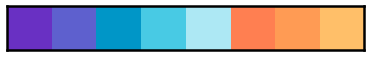

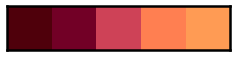

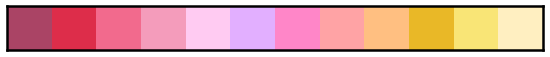

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

def custom_palette(custom_colors):
    customPalette = sns.set_palette(sns.color_palette(custom_colors))
    sns.palplot(sns.color_palette(custom_colors),size=0.8)
    plt.tick_params(axis='both', labelsize=0, length = 0)

#defining colour palette
red = ["#4f000b","#720026","#ce4257","#ff7f51","#ff9b54"]
bo = ["#6930c3","#5e60ce","#0096c7","#48cae4","#ade8f4","#ff7f51","#ff9b54","#ffbf69"]
pink = ["#aa4465","#dd2d4a","#f26a8d","#f49cbb","#ffcbf2","#e2afff","#ff86c8","#ffa3a5","#ffbf81","#e9b827","#f9e576","#ffefc1"]

custom_palette(bo)
custom_palette(red)
custom_palette(pink)#các plot sẽ dùng palette gọi sau cùng

---
# Import data

In [ ]:
df = pd.read_csv('/content/GLC_features.csv', parse_dates=['event_date'])
df.shape

# df_p = pd.read_csv('/content/GLC_features_preprocessed.csv', parse_dates=['event_date'], na_filter= False)
# df_p.shape


(11033, 67)

**Check datatype and missing values**



In [ ]:
df.dtypes

source_name                        object
source_link                        object
event_id                            int64
event_date                 datetime64[ns]
event_time                        float64
                                ...      
population_density_2000           float64
population_density_2005           float64
population_density_2010           float64
population_density_2015           float64
population_density_2020           float64
Length: 67, dtype: object

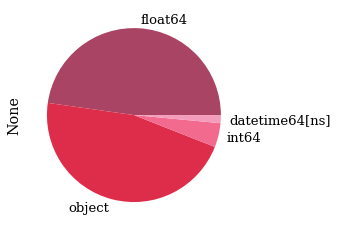

In [ ]:
df.dtypes.value_counts().plot(kind='pie')

In [ ]:
df.isnull().sum().sort_values(ascending=False)

event_time          11033
notes               10716
storm_name          10456
photo_link           9537
windgust             7207
                    ...  
longitude               0
event_date              0
event_id                0
last_edited_date        0
source_name             0
Length: 67, dtype: int64

# **EDA**

In [ ]:
df.head()

,source_name,source_link,event_id,event_date,event_time,event_title,event_description,location_description,location_accuracy,landslide_category,landslide_trigger,landslide_size,landslide_setting,fatality_count,injury_count,storm_name,photo_link,notes,event_import_source,event_import_id,country_name,country_code,admin_division_name,admin_division_population,gazeteer_closest_point,gazeteer_distance,submitted_date,created_date,last_edited_date,longitude,latitude,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,precip,precipcover,windgust,windspeed,winddir,pressure,cloudcover,visibility,moonphase,conditions,stations,elevation,continent,season,treecover2000,loss,gain,soil_texture_0,soil_texture_10,soil_texture_30,soil_texture_60,soil_texture_100,soil_texture_200,population_density_2000,population_density_2005,population_density_2010,population_density_2015,population_density_2020
0,AGU,https://blogs.agu.org/landslideblog/2008/10/14...,684,2008-08-01 00:00:00,NaN,"Sigou Village, Loufan County, Shanxi Province","occurred early in morning, 11 villagers buried...","Sigou Village, Loufan County, Shanxi Province",unknown,landslide,rain,large,mine,11.0,NaN,NaN,NaN,NaN,glc,684.0,China,CN,Shaanxi,0.0,Jingyang,41.02145,04/01/2014 12:00:00 AM,11/20/2017 03:17:00 PM,02/15/2018 03:51:00 PM,107.4500,32.5625,31.2,24.5,27.3,32.6,24.5,28.2,20.3,66.50,0.00,0.00,NaN,8.3,230.4,1006.9,63.1,17.2,0.00,Partially cloudy,"['57237099999', '57127099999']",709.0,Asia,summer,0,0.0,0,Lo,Lo,Lo,Lo,ClLo,ClLo,10.897663,10.860593,10.777864,10.649446,10.416670
1,Oregonian,http://www.oregonlive.com/news/index.ssf/2009/...,956,2009-01-02 02:00:00,NaN,"Lake Oswego, Oregon",Hours of heavy rain are to blame for an overni...,"Lake Oswego, Oregon",5km,mudslide,downpour,small,unknown,0.0,NaN,NaN,NaN,NaN,glc,956.0,United States,US,Oregon,36619.0,Lake Oswego,0.60342,04/01/2014 12:00:00 AM,11/20/2017 03:17:00 PM,02/15/2018 03:51:00 PM,-122.6630,45.4200,6.0,1.1,3.2,5.2,-4.6,1.7,1.2,87.27,26.99,58.33,NaN,26.7,213.1,1010.4,56.2,14.7,0.14,"Rain, Partially cloudy","['72695994281', '72698024229', '72791894298']",39.0,North America,winter,0,0.0,0,Lo,Lo,Lo,Lo,Lo,Lo,1709.162231,1803.502075,1896.032104,1971.151001,2037.960693
2,CBS News,https://www.cbsnews.com/news/dozens-missing-af...,973,2007-01-19 00:00:00,NaN,"San Ramon district, 195 miles northeast of the...",(CBS/AP) At least 10 people died and as many a...,"San Ramon district, 195 miles northeast of the...",10km,landslide,downpour,large,unknown,10.0,NaN,NaN,NaN,NaN,glc,973.0,Peru,PE,Junín,14708.0,San Ramón,0.85548,04/01/2014 12:00:00 AM,11/20/2017 03:17:00 PM,02/15/2018 03:51:00 PM,-75.3587,-11.1295,0.0,0.0,NaN,0.0,0.0,NaN,NaN,NaN,NaN,0.00,NaN,NaN,NaN,NaN,NaN,NaN,0.00,NaN,NaN,846.0,South America,summer,0,0.0,0,ClLo,ClLo,ClLo,ClLo,ClLo,ClLo,40.594688,42.369690,43.759224,44.929241,45.351627
3,Reuters,https://in.reuters.com/article/idINIndia-41450...,1067,2009-07-31 00:00:00,NaN,Dailekh district,"One person was killed in Dailekh district, pol...",Dailekh district,unknown,landslide,monsoon,medium,unknown,1.0,NaN,NaN,NaN,NaN,glc,1067.0,Nepal,NP,Mid Western,20908.0,Dailekh,0.75395,04/01/2014 12:00:00 AM,11/20/2017 03:17:00 PM,02/15/2018 03:51:00 PM,81.7080,28.8378,23.9,23.9,23.9,23.9,23.9,23.9,23.4,97.03,0.00,0.00,NaN,0.0,NaN,996.4,60.0,5.0,0.37,Partially cloudy,['44416099999'],1396.0,Asia,summer,0,0.0,0,Lo,Lo,Lo,ClLo,ClLo,ClLo,67.572578,77.243866,80.174164,76.922607,65.961479
4,The Freeman,http://www.philstar.com/cebu-news/621414/lands...,2603,2010-10-16 12:00:00,NaN,sitio Bakilid in barangay Lahug,Another landslide in sitio Bakilid in barangay...,sitio Bakilid in barangay Lahug,5km,landslide,tropical_cyclone,medium,unknown,0.0,NaN,Supertyphoon Juan (Megi),NaN,NaN,glc,2603.0,Philippines,PH,Central Visayas,798634.0,Cebu City,2.02204,04/01/2014 12:00:00 AM,11/20/2017 03:17:00 PM,02/15/2018 03:51:00 PM,123.8978,10.3336,31.0,24.0,27.5,40.6,24.0,31.5,25.2,87.48,8.90,8.70,NaN,14.8,176.8,1008.0,88.6,9.8,0.33,"Rain, Partial

## Value distribution & General

**Phân bố số lượng sample theo biến mục tiêu**

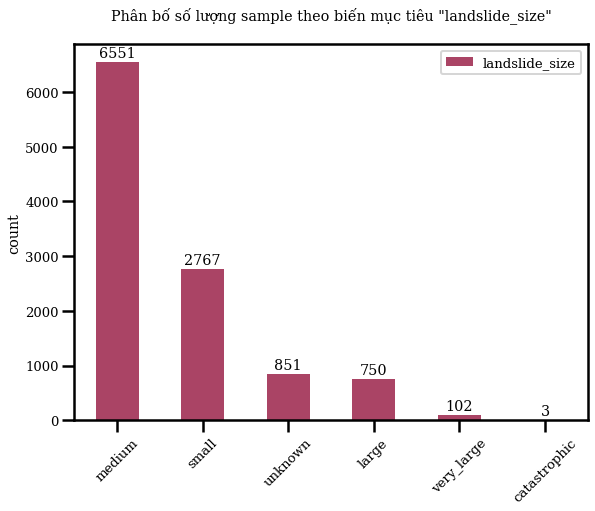

In [ ]:
fig,ax = plt.subplots()

df['landslide_size'].value_counts().to_frame().plot(kind='bar',ax=ax)

for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')

plt.title('Phân bố số lượng sample theo biến mục tiêu "landslide_size"',y=1.05)
plt.ylabel('count')
plt.xticks(rotation=45)
fig.tight_layout(pad=-7)

**Phân bố số lượng sample của thuộc tính:**
* landslide_trigger &ensp;&nbsp;: nguyên nhân gây sạt lở đất
* landslide_category: loại sạt lở đất
* landslide_size &emsp;&ensp;&nbsp; : mức độ sạt lở dất

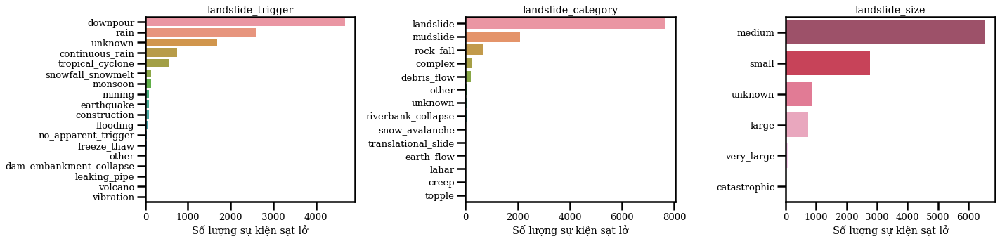

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(20, 5))

trigger_count = df['landslide_trigger'].value_counts()
category_count = df['landslide_category'].value_counts()
size_count = df['landslide_size'].value_counts()

sns.barplot(x=trigger_count, y=trigger_count.index, ax=ax[0]).set(title=trigger_count.name, xlabel='Số lượng sự kiện sạt lở')
sns.barplot(x=category_count, y=category_count.index, ax=ax[1]).set(title=category_count.name, xlabel='Số lượng sự kiện sạt lở')
sns.barplot(x=size_count, y=size_count.index, ax=ax[2]).set(title=size_count.name, xlabel='Số lượng sự kiện sạt lở')

fig.tight_layout()
plt.show()

**Phân bố số lượng sample của thuộc tính:**
* season
* continent

[Text(0, 0.5, 'Số lượng sự kiện sạt lở'), Text(0.5, 0, 'Continent')]

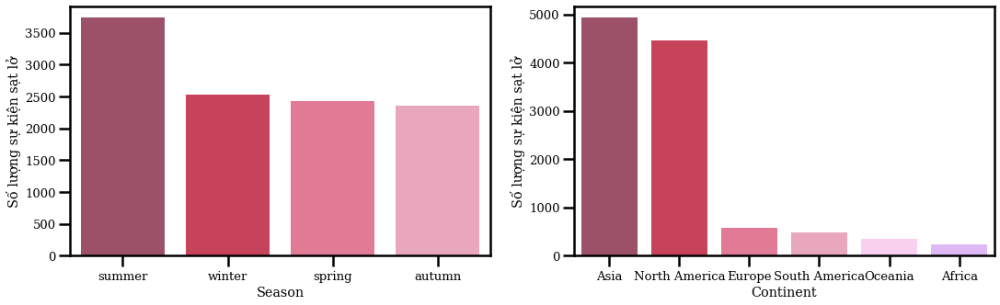

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(18, 5))

season_count = df['season'].value_counts()
continent_count = df['continent'].value_counts()

sns.barplot(x=season_count.index, y=season_count, ax=ax[0]).set(xlabel='Season', ylabel='Số lượng sự kiện sạt lở')
sns.barplot(x=continent_count.index,y=continent_count, ax=ax[1]).set(xlabel='Continent', ylabel='Số lượng sự kiện sạt lở')

**Top 10 quốc gia diễn ra sạt lở thường xuyên nhất**

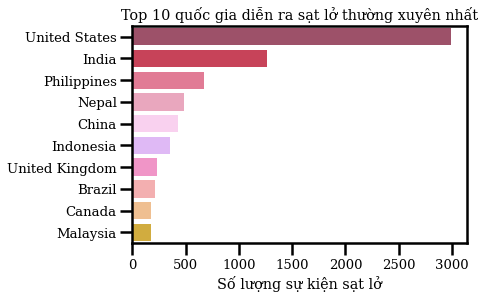

In [ ]:
top10country = df['country_name'].value_counts().sort_values(ascending=False).head(10)

sns.barplot(x=top10country, y=top10country.index).set(
                                                    title="Top 10 quốc gia diễn ra sạt lở thường xuyên nhất",
                                                    xlabel='Số lượng sự kiện sạt lở'
                                               )
plt.show()

**Top 10 quốc gia có tỉ lệ người tử vong/bị thương cao nhất**

[Text(1032.281818181818, 0.5, 'Quốc gia'),
 Text(0.5, 39.5, 'Tổng số người thương vong')]

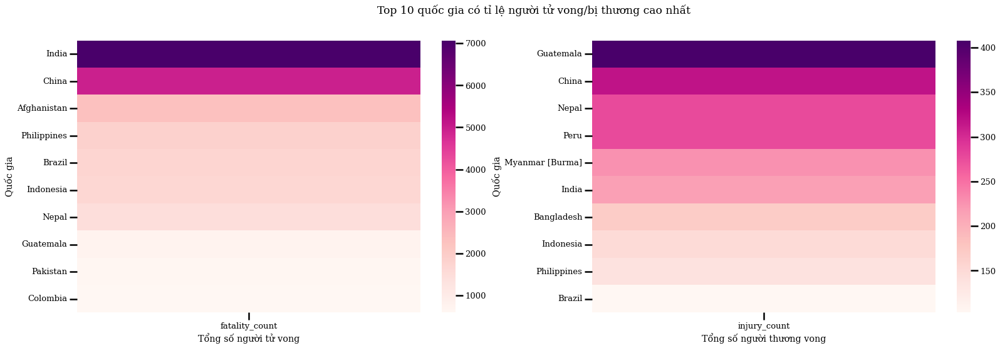

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(27, 8))

df_country_fatality = df.groupby('country_name')[['fatality_count']].sum()
df_country_fatality_max = df_country_fatality.sort_values('fatality_count', ascending = False).head(10)

df_country_injury = df.groupby('country_name')[['injury_count']].sum()
df_country_injury_max = df_country_injury.sort_values('injury_count', ascending = False).head(10)

plt.suptitle('Top 10 quốc gia có tỉ lệ người tử vong/bị thương cao nhất')
sns.heatmap(df_country_fatality_max, cmap = 'RdPu',ax=ax[0]).set(xlabel="Tổng số người tử vong", ylabel="Quốc gia")
sns.heatmap(df_country_injury_max, cmap = 'RdPu', ax=ax[1]).set(xlabel="Tổng số người thương vong",ylabel="Quốc gia")

**Phân bố hằng tháng các vụ sạt lở đất từ năm 1988 đến năm 2017** \\
    &emsp; tại 3 quốc gia: United States, India, Vietnam

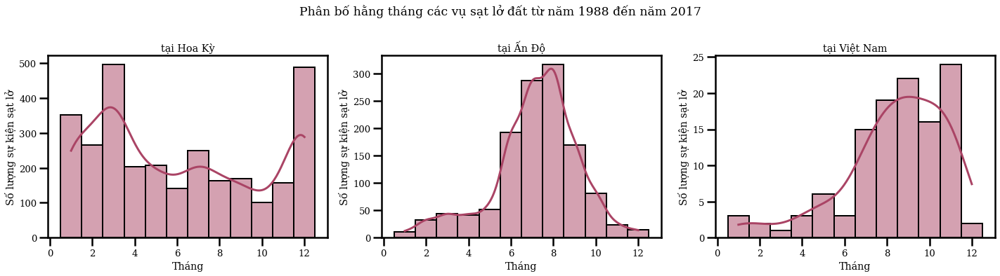

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(20, 5))

bins = np.arange(13) + 0.5

df_country_US = df.loc[lambda df: df['country_name'] == 'United States', :].loc[:, ['country_name', 'event_date']]
month_country_US = df_country_US['event_date'].dt.month

df_country_India = df.loc[lambda df: df['country_name'] == 'India', :].loc[:, ['country_name', 'event_date']]
month_country_India = df_country_India['event_date'].dt.month

df_country_Vietnam = df.loc[lambda df: df['country_name'] == 'Vietnam', :].loc[:, ['country_name', 'event_date']]
month_country_Vietnam = df_country_Vietnam['event_date'].dt.month

sns.histplot(x=month_country_US, kde=True, bins=bins, ax=ax[0]).set(title='tại Hoa Kỳ', xlabel='Tháng', ylabel='Số lượng sự kiện sạt lở')
sns.histplot(x=month_country_India, kde=True, bins=bins, ax=ax[1]).set(title='tại Ấn Độ', xlabel='Tháng', ylabel='Số lượng sự kiện sạt lở')
sns.histplot(x=month_country_Vietnam, kde=True, bins=bins, ax=ax[2]).set(title='tại Việt Nam', xlabel='Tháng', ylabel='Số lượng sự kiện sạt lở')
plt.suptitle("Phân bố hằng tháng các vụ sạt lở đất từ năm 1988 đến năm 2017", x=0.5, y=1.1)
fig.tight_layout()
plt.show()


**Độ cao địa hình và mức độ sạt lở đất theo từng châu lục**

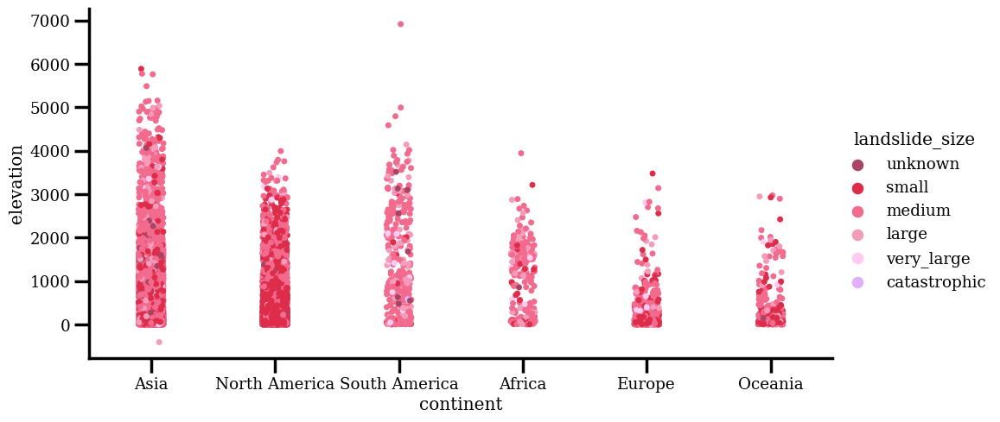

In [ ]:
p = sns.catplot(x='continent',y='elevation',hue='landslide_size',data=df,hue_order=['unknown','small','medium','large','very_large','catastrophic'],aspect=2)
p.fig.set_dpi(100)

**Độ cao địa hình và mức độ sạt lở đất theo từng loại kết cấu đất**

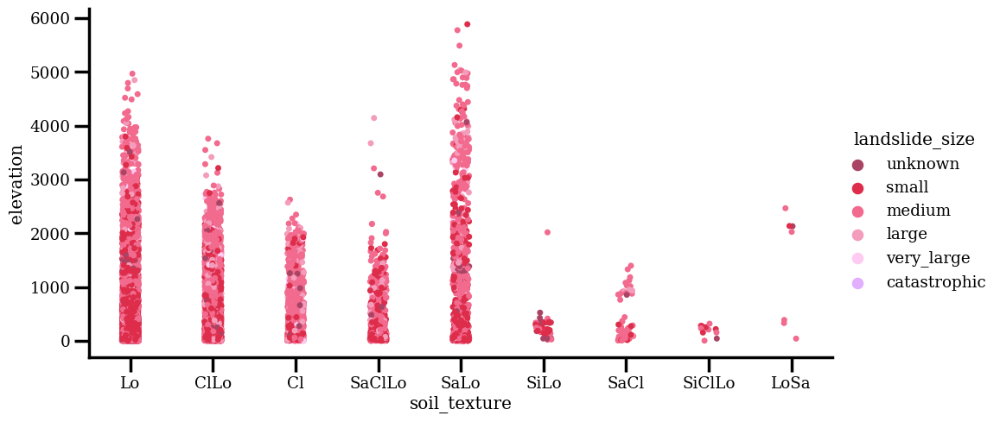

In [ ]:
s_t = ['soil_texture_0', 'soil_texture_10',
       'soil_texture_30', 'soil_texture_60',
       'soil_texture_100','soil_texture_200']
tmp = df.copy()
tmp['soil_texture'] = tmp[s_t].mode(axis=1)[0]
p = sns.catplot(x='soil_texture',y='elevation',hue='landslide_size',data=tmp,hue_order=['unknown','small','medium','large','very_large','catastrophic'],aspect=2)
p.fig.set_dpi(100)

**Số sự kiện sạt lở đất xảy ra và độ cao của top 20 quốc gia**

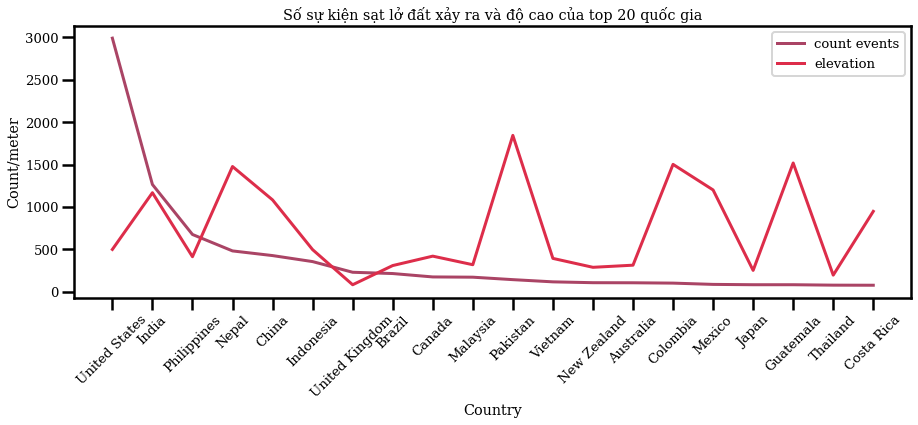

In [ ]:
df_country_elevation = df.groupby('country_name')['elevation'].mean()
top10country = df['country_name'].value_counts().sort_values(ascending=False).head(20).to_frame()
for i in (top10country.index):
  top10country.loc[i, 'elevation'] = df_country_elevation.loc[i]

plt.figure(figsize=(15, 5))

sns.lineplot(data=top10country['country_name'], label='count events')
sns.lineplot(data=top10country['elevation'], label='elevation')

plt.xlabel('Country')
plt.ylabel('Count/meter')
plt.title('Số sự kiện sạt lở đất xảy ra và độ cao của top 20 quốc gia')
plt.tick_params(axis='x', rotation=45)
plt.show()

Text(0, 0.5, 'Trung bình pressure')

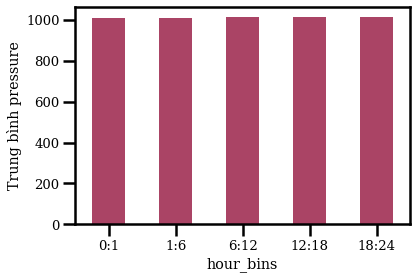

In [ ]:
df['event_date'] = pd.to_datetime(df['event_date'],format='%m/%d/%Y %I:%M:%S %p',dayfirst=True, errors='coerce')
tmp_t = df.copy()
bins = [0,1,6,12,18,24]
labels = ['0:1', '1:6', '6:12', '12:18', '18:24']
tmp_t['hour_bins'] = pd.cut(tmp_t['event_date'].dt.hour, bins=bins, labels=labels, right=False)
hour_pressure = tmp_t.groupby('hour_bins')['pressure'].mean()
hour_pressure.plot(kind='bar')
plt.tick_params(axis='x', rotation=0)
plt.ylabel("Trung bình pressure")
# hmmm pressure thu thập k theo hour

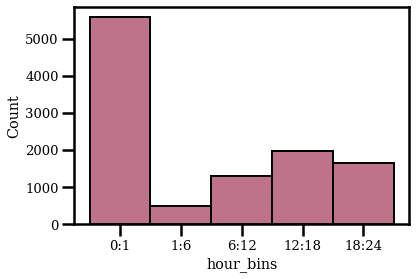

In [ ]:
sns.histplot(x=tmp_t['hour_bins'], kde=False, bins=bins)

## Descriptive Analysis



In [ ]:
num_cols = []
cat_cols = []
for i in df.columns:
  if(df[i].dtypes!='object' and i not in ['event_id','event_time','event_import_id'] and df[i].dtypes!='datetime64[ns]'):
    num_cols.append(i)
  if(df[i].dtypes=='object'):
    cat_cols.append(i)

In [ ]:
weather_cols = ['tempmax',
 'tempmin',
 'temp',
 'feelslikemax',
 'feelslikemin',
 'feelslike',
 'dew',
 'humidity',
 'precip',
 'precipcover',
 'windgust',
 'windspeed',
 'winddir',
 'pressure',
 'cloudcover',
 'visibility',
 'moonphase']

In [ ]:
df[weather_cols].describe().T

,count,mean,std,min,25%,50%,75%,max
tempmax,11004.0,18.857534,10.496720,-22.10,11.2000,21.10,27.9000,45.1
tempmin,11004.0,12.979198,9.323941,-27.10,4.8000,13.20,22.1000,32.1
temp,9776.0,17.725378,8.279178,-24.80,10.8000,19.50,25.1000,38.4
feelslikemax,11001.0,19.957177,12.401510,-22.10,11.2000,21.10,30.0000,51.9
feelslikemin,11001.0,12.307445,10.235743,-32.30,2.3000,13.20,22.1000,41.0
feelslike,9773.0,17.842014,9.817092,-28.00,10.4000,19.50,25.5000,43.6
dew,9740.0,14.202977,8.887815,-27.90,7.3000,14.90,22.6000,175.5
humidity,9740.0,81.949669,13.122496,14.69,76.9175,85.02,90.9500,100.0
precip,9776.0,30.272759,52.780018,0.00,0.3000,10.40,35.9725,498.0
precipcover,11004.0,26.585559,30.337672,0.00,0.0000,13.64,45.8300,100.0


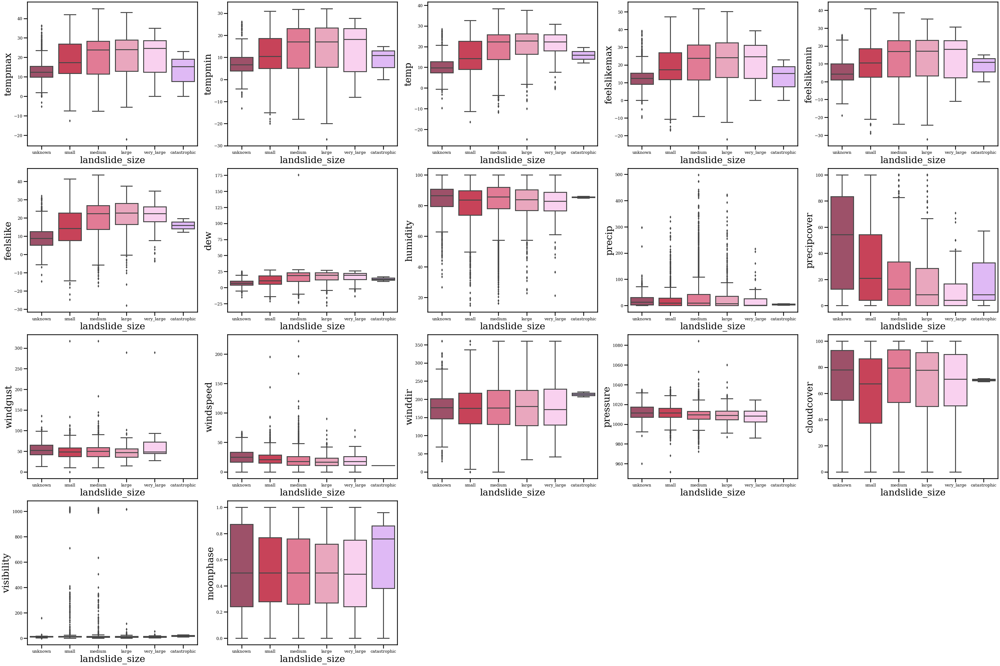

In [ ]:
fig, axs = plt.subplots(4,5,figsize=(45,30))

c= 0
for i in range(4):
  for j in range(5):
    sns.boxplot(x='landslide_size',y=weather_cols[c],data=df,ax=axs[i,j],order=['unknown','small','medium','large','very_large','catastrophic'])
    c+=1
    if(c==len(weather_cols)): break

for idx,ax in enumerate(axs.flat):
  ax.set_xlabel('landslide_size', fontsize = 30)
  ax.set_ylabel(weather_cols[idx], fontsize = 30)
  if(idx==len(weather_cols)-1):break

fig.delaxes(axs[3][2])
fig.delaxes(axs[3][3])
fig.delaxes(axs[3][4])
plt.tight_layout()

**Tương quan giữa landslide_size và injury and faltality**

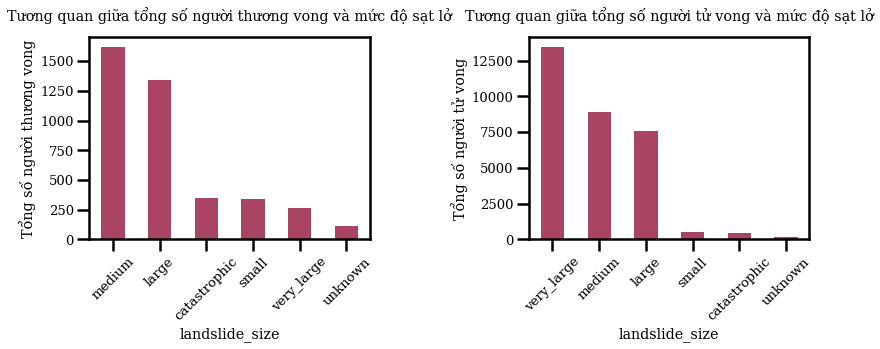

In [ ]:
fig ,axs = plt.subplots(1,2,figsize=(12,5))
l = ['injury_count', 'fatality_count'] 

for i in range(2):
  tmp = df.groupby('landslide_size')[l[i]].sum().sort_values(ascending=False)
  tmp.plot(kind='bar',ax=axs[i])
  axs[i].tick_params(axis='x', rotation=45)

axs[0].set_title("Tương quan giữa tổng số người thương vong và mức độ sạt lở",y=1.05)
axs[0].set_ylabel('Tổng số người thương vong')

axs[1].set_title("Tương quan giữa tổng số người tử vong và mức độ sạt lở",y=1.05)
axs[1].set_ylabel('Tổng số người tử vong')
plt.tight_layout()

In [ ]:
df.groupby(['landslide_size'])['injury_count'].sum()

landslide_size
catastrophic     344.0
large           1344.0
medium          1623.0
small            341.0
unknown          112.0
very_large       263.0
Name: injury_count, dtype: float64

**Tương quan giữa landslide_size và elevation**

Text(0.5, 1.0, 'Tương quan giữa độ cao địa hình và mức độ sạt lở')

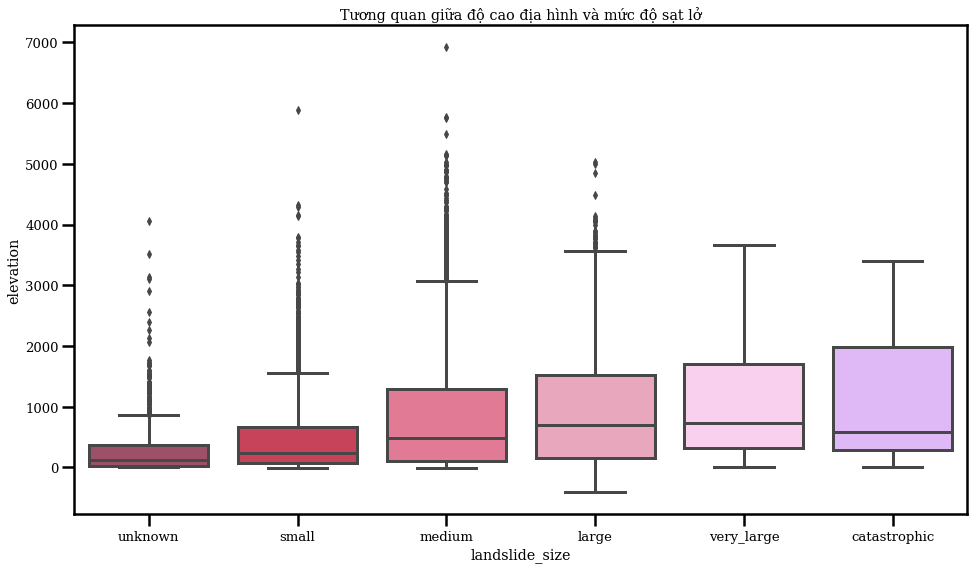

In [ ]:
plt.figure(figsize=(16,9))

sns.boxplot(x='landslide_size',y='elevation',data=df,order=['unknown','small','medium','large','very_large','catastrophic'])
plt.title('Tương quan giữa độ cao địa hình và mức độ sạt lở')

**Tương quan giữa trung bình độ cao và mức độ sạt lở**

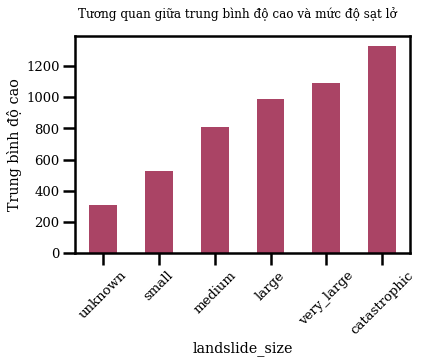

In [ ]:
size_elevation = df.groupby('landslide_size')['elevation'].mean().sort_values(ascending=True)
size_elevation.plot(kind='bar')
plt.ylabel("Trung bình độ cao")
plt.suptitle("Tương quan giữa trung bình độ cao và mức độ sạt lở")
plt.tick_params(axis='x', rotation=45)

**Tương quan giữa landslide_size và treecover2000**

Text(0.5, 1.0, 'Tương quan giữa độ che phủ rừng và mức độ sạt lở')

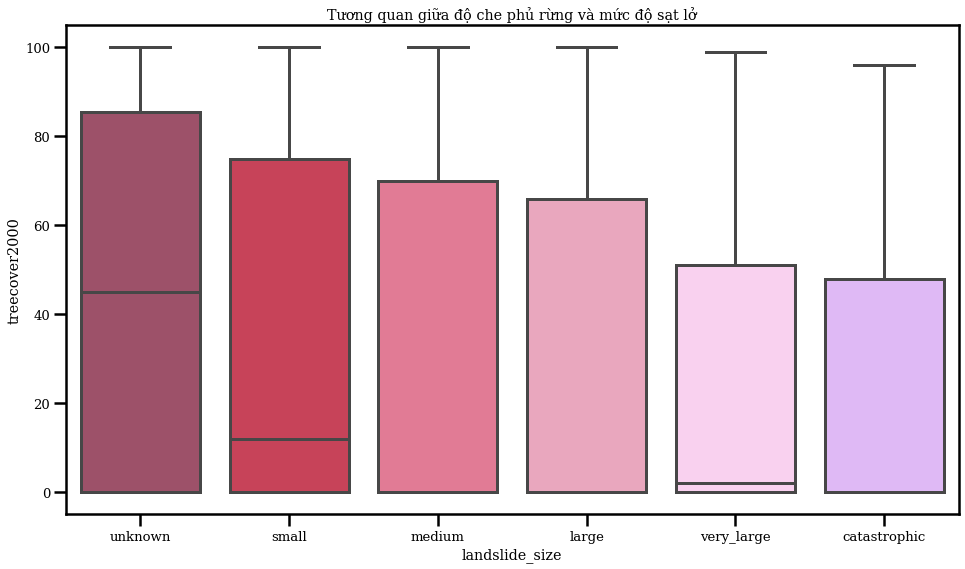

In [ ]:
plt.figure(figsize=(16,9))

sns.boxplot(x='landslide_size',y='treecover2000',data=df,order=['unknown','small','medium','large','very_large','catastrophic'])
plt.title('Tương quan giữa độ che phủ rừng và mức độ sạt lở')

**Tương quan giữa trung bình độ che phủ rừng và mức độ sạt lở**

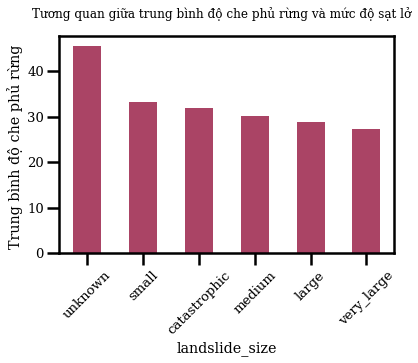

In [ ]:
size_treecover2000 = df.groupby('landslide_size')['treecover2000'].mean().sort_values(ascending=False)
size_treecover2000.plot(kind='bar')
plt.ylabel("Trung bình độ che phủ rừng ")
plt.suptitle("Tương quan giữa trung bình độ che phủ rừng và mức độ sạt lở")
plt.tick_params(axis='x', rotation=45)

**Tương quan giữa landslide_size và population_density_avg**

In [ ]:
tmp = df.copy()
ppd = ['population_density_2000', 'population_density_2005',
       'population_density_2010', 'population_density_2015',
       'population_density_2020']

tmp['population_dense_avg'] = tmp[ppd].mean(axis=1)

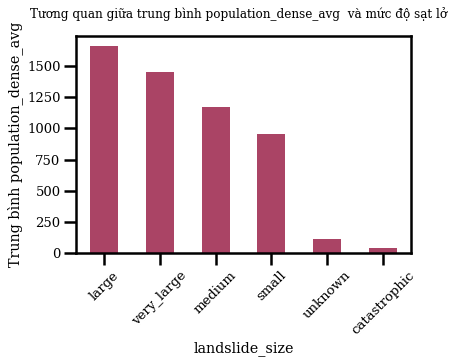

In [ ]:
size_ppd= tmp.groupby('landslide_size')['population_dense_avg'].mean().sort_values(ascending=False)
size_ppd.plot(kind='bar')
plt.ylabel("Trung bình population_dense_avg")
plt.suptitle("Tương quan giữa trung bình population_dense_avg  và mức độ sạt lở")
plt.tick_params(axis='x', rotation=45)

**Hình dạng dữ liệu các thuộc tính định lượng**

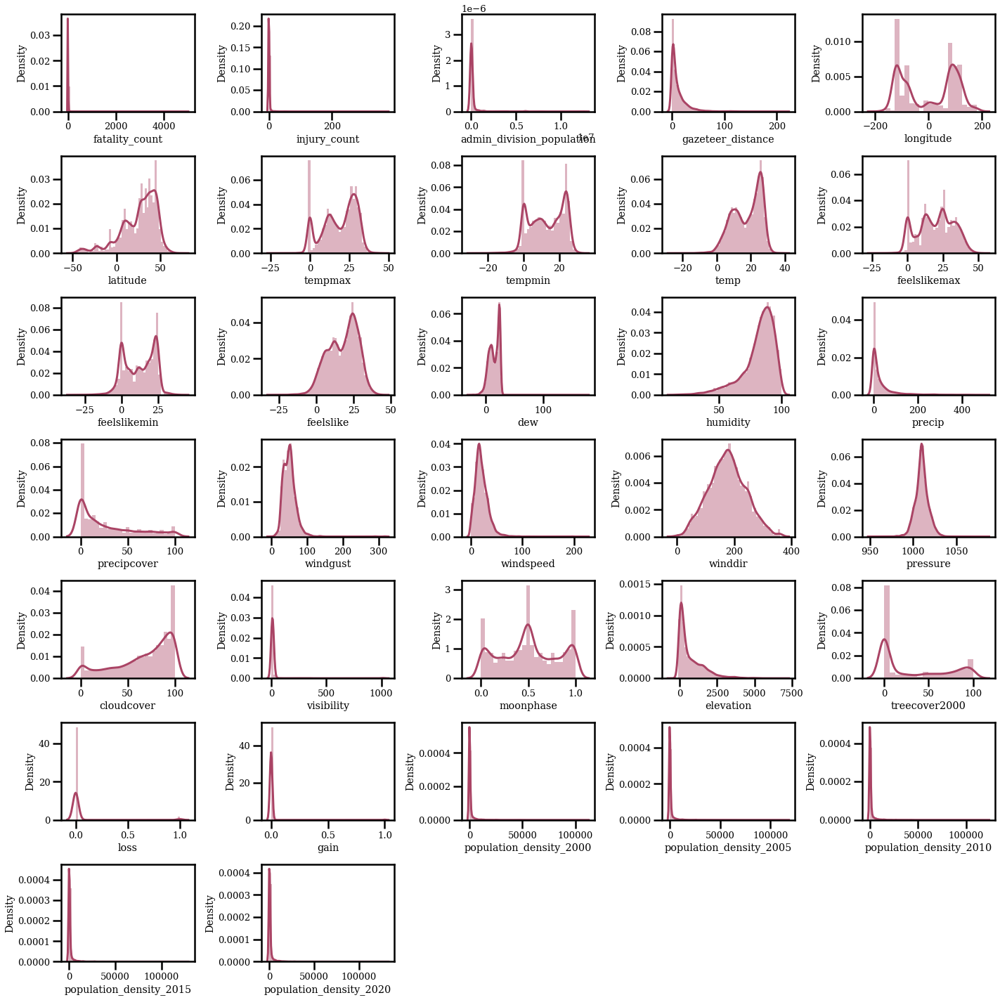

In [ ]:
%%capture --no-display
fig = plt.figure(figsize=(20,20))
for i in range(len(num_cols)):
    ax = plt.subplot(7,5, i+1)
    sns.distplot(num_df[num_cols[i]], kde=True, ax=ax)
plt.tight_layout()
plt.show()

## Time Series Analysis



**Thống kê số sự kiện sạt lở theo tháng và năm**

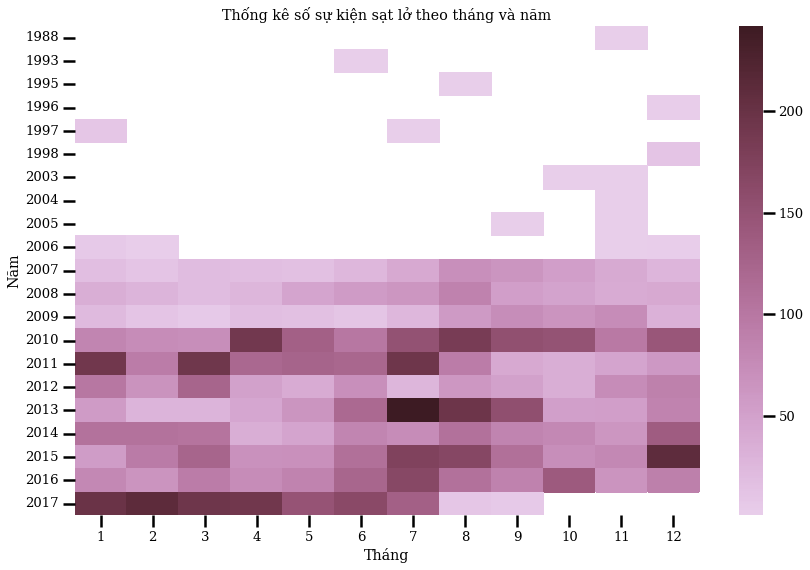

In [ ]:
import numpy as np

df_my = df.copy()
df_my['Year'] = df_my['event_date'].dt.year
df_my['Month'] = df_my['event_date'].dt.month

tmp = df_my[['Month','Year']].copy()
tmp['Count'] = np.ones(tmp.shape[0])

grp = tmp.groupby(['Month','Year'],as_index=False).sum()

grp_pivot = grp.pivot(index='Year',columns='Month')
plt.figure(figsize=(14,9))
ax = sns.heatmap(grp_pivot,xticklabels=grp_pivot.columns.get_level_values(1),
            cmap=sns.color_palette("ch:start=.9,rot=-.2", as_cmap=True))
ax.set(xlabel='Tháng', ylabel='Năm', title='Thống kê số sự kiện sạt lở theo tháng và năm')
plt.show()

**Số lượng sự kiện sạt lở diễn ra qua các năm**

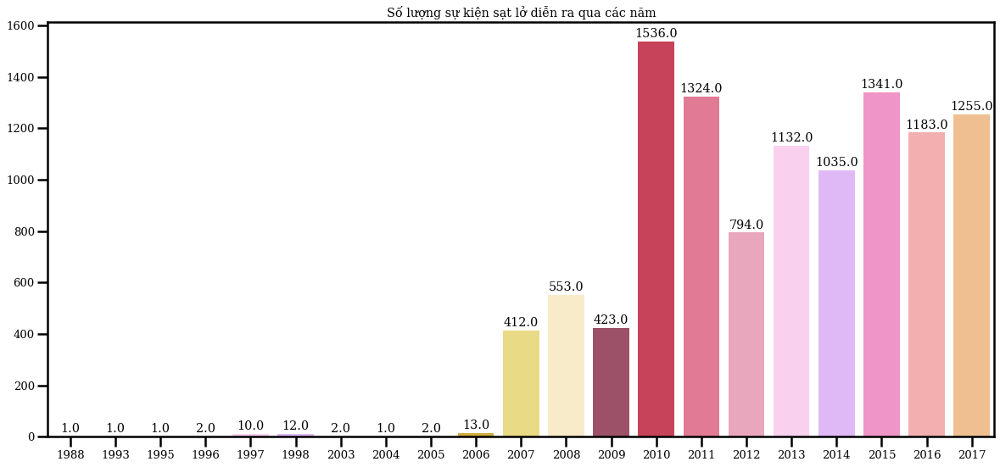

In [ ]:
event_date_count = df['event_date'].dt.year.value_counts().sort_index()
fig, ax = plt.subplots(figsize=(20,9))
sns.barplot(x=event_date_count.index, y=event_date_count, data=df,palette=pink)

ax.set(title='Số lượng sự kiện sạt lở diễn ra qua các năm', ylabel='') 

for p in ax.patches:
    ax.annotate(format(p.get_height(), '.1f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')

**Số lượng sự kiện sạt lở diễn ra qua các tháng**

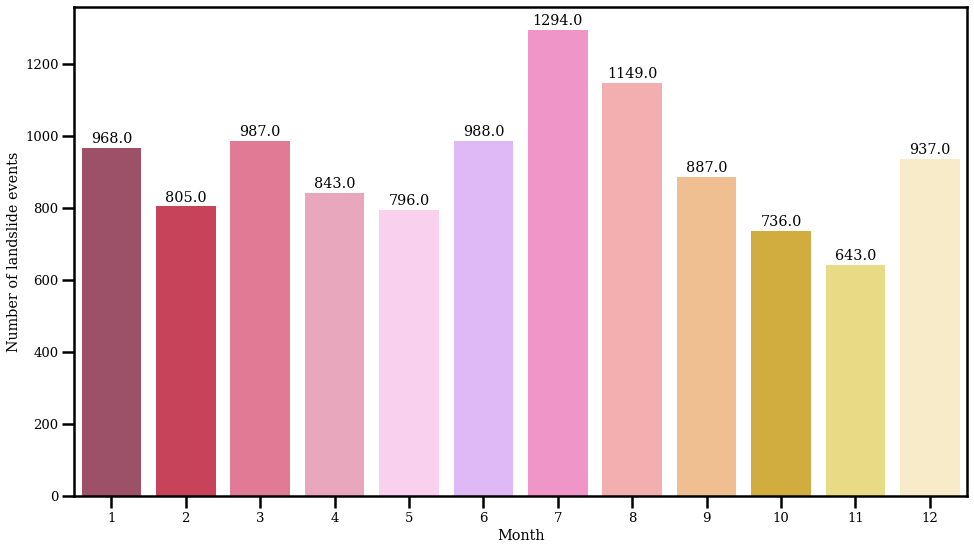

In [ ]:
event_date_count = df['event_date'].dt.month.value_counts().sort_index()
fig, ax = plt.subplots(figsize=(16,9))
sns.barplot(x=event_date_count.index, y=event_date_count, data=df,palette=pink)

ax.set(ylabel='Number of landslide events') 
ax.set(xlabel='Month') 

for p in ax.patches:
    ax.annotate(format(p.get_height(), '.1f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')

**Số sự kiện sạt lở đất xảy ra và số lượng người tử vong/bị thương theo từng năm**

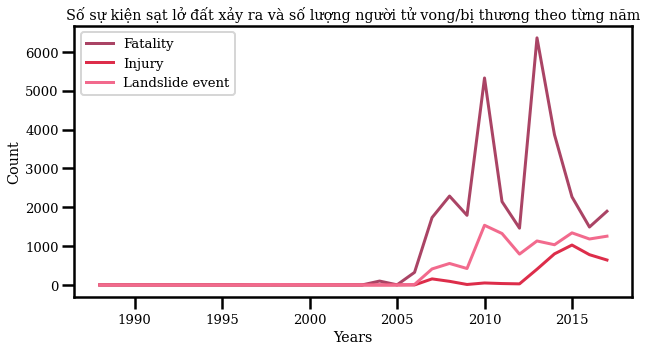

In [ ]:
df['event_year'] = df['event_date'].dt.year
df_by_year = df.sort_values('event_year')
df_by_year = df_by_year.set_index('event_year')

plt.figure(figsize=(10, 5))

sns.lineplot(data=df_by_year['fatality_count'].groupby('event_year').sum(), label='Fatality')
sns.lineplot(data=df_by_year['injury_count'].groupby('event_year').sum(), label='Injury')
sns.lineplot(data=df.groupby('event_year').count()['event_date'], label='Landslide event')

plt.xlabel('Years')
plt.ylabel('Count')
plt.title('Số sự kiện sạt lở đất xảy ra và số lượng người tử vong/bị thương theo từng năm')
plt.show()

**Số lượng sự kiện và mức độ sạt lở qua các năm**

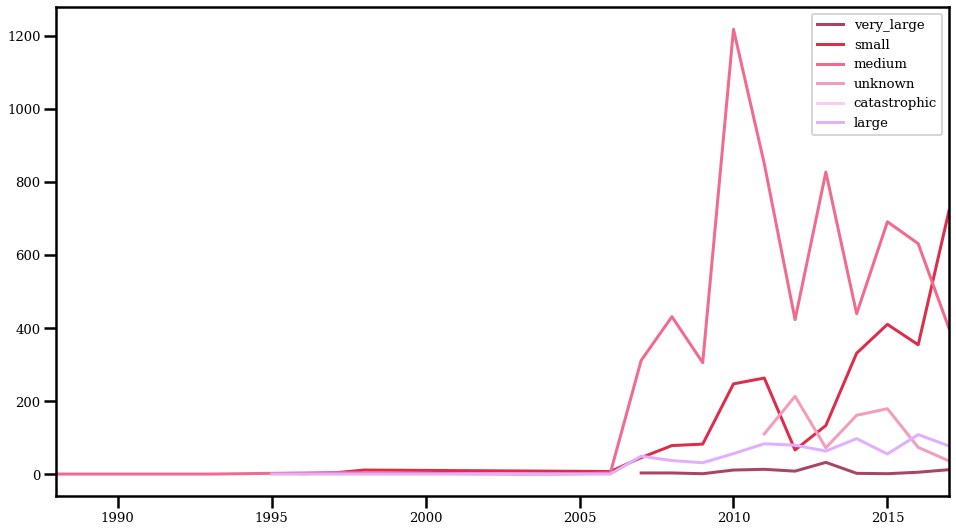

In [ ]:
df_my.dropna(subset=['landslide_size'],inplace=True)
plt.figure(figsize=(16,9))

for t in set(df_my['landslide_size']):
  df_my[df_my['landslide_size']==t]['Year'].value_counts().sort_index().plot(kind='line',xlim=(1988,2017))
  c+=1
plt.legend(set(df_my['landslide_size']))




## Basemap



In [ ]:
!pip install basemap-data
!pip install basemap-data-hires
!pip install basemap

In [ ]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap

In [ ]:
from itertools import chain

def draw_map(m, scale=0.2):
    # draw a shaded-relief image
    m.shadedrelief(scale=scale)
    
    # lats and longs are returned as a dictionary
    lats = m.drawparallels(np.linspace(-90, 90, 13))
    lons = m.drawmeridians(np.linspace(-180, 180, 13))

    # keys contain the plt.Line2D instances
    lat_lines = chain(*(tup[1][0] for tup in lats.items()))
    lon_lines = chain(*(tup[1][0] for tup in lons.items()))
    all_lines = chain(lat_lines, lon_lines)
    
    # cycle through these lines and set the desired style
    for line in all_lines:
        line.set(linestyle='-', alpha=0.3, color='w')

**Phân bố các địa điểm xảy ra sạt lở trên thế giới từ năm 1988 đến năm 2017**

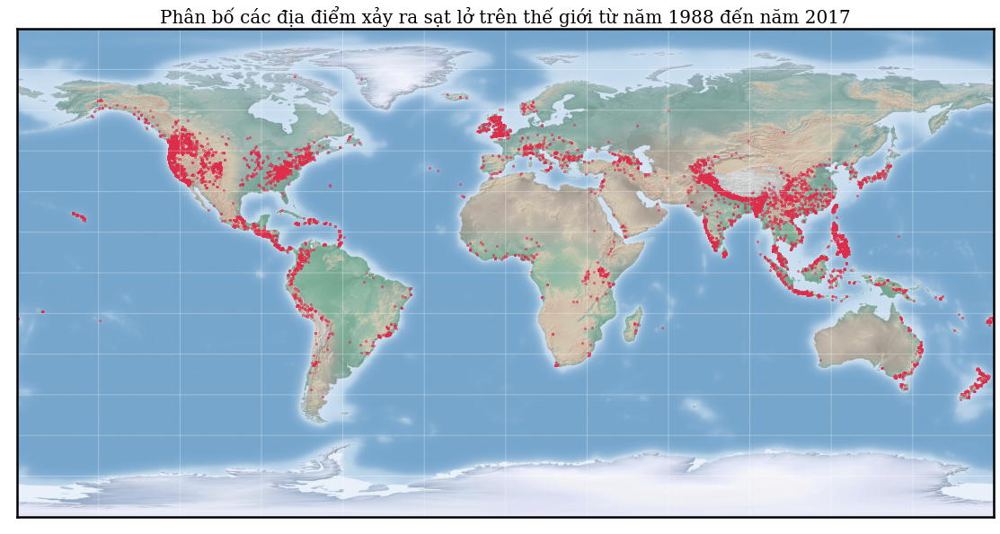

In [ ]:
fig = plt.figure(figsize=(25, 10), edgecolor='w')
m = Basemap(projection='cyl', resolution=None,
            llcrnrlat=-90, urcrnrlat=90,
            llcrnrlon=-180, urcrnrlon=180, )
draw_map(m)

lat = df['latitude']
lon = df['longitude']

m.scatter(lon, lat, latlon=True,
          c=pink[1],alpha=1,s=0.5)
plt.title('Phân bố các địa điểm xảy ra sạt lở trên thế giới từ năm 1988 đến năm 2017',fontsize=20)
plt.savefig('world_map.png',dpi=100)

**Phân bố các địa điểm xảy ra sạt lở ở từng châu lục từ năm 1988 đến năm 2017**

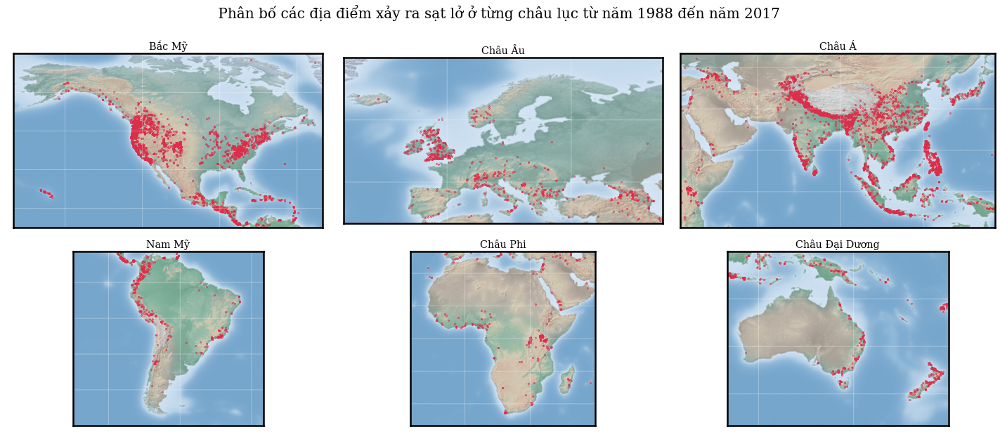

<Figure size 432x288 with 0 Axes>

In [ ]:
lat_lon_continent = {'Bắc Mỹ':[7.5,75,-170,-50],
                     'Châu Âu':[35,75,-25,52],
                     'Châu Á':[-13,50,32,146],
                     'Nam Mỹ':[-60,13,-105,-25],
                     'Châu Phi':[-40,40,-25,60],
                     'Châu Đại Dương':[-55,0,110,180]}

fig, axs = plt.subplots(2,3,figsize=(20,8))
fig.suptitle(' Phân bố các địa điểm xảy ra sạt lở ở từng châu lục từ năm 1988 đến năm 2017 ',fontsize=20, y=1.08)

i = 0
j = 0

lat = df['latitude']
lon = df['longitude']

for key,val in lat_lon_continent.items():
  m = Basemap(projection='cyl', resolution=None,
              llcrnrlat=val[0], urcrnrlat=val[1],
              llcrnrlon=val[2], urcrnrlon=val[3],ax=axs[i,j])
  title = axs[i,j].set_title(key)
  draw_map(m)
  scatter = m.scatter(lon, lat, latlon=True,c=pink[1],s=0.5,alpha=1,ax=axs[i,j])

  j+=1
  if(j>2):
    i = 1
    j = 0
  if(i==1 and j>2):
    break

plt.tight_layout()
plt.show()
plt.savefig('continents.png',dpi=100)

**Trực quan kích thước sạt lở và độ che phủ rừng tại điểm sạt lở**

In [ ]:
def feature_and_size_map(df,feature,cmap='magma',log10_=True):
  l = {'unknown':20,'small':50,'medium':150,'large':250,'very_large':1000,'catastrophic':2000}
  s_ = [*map(l.get,  df['landslide_size'])]
  tmp = df.copy()
  tmp['s'] = s_

  
  if(log10_==True):
    feature_val = np.log10(tmp[feature].values)
  else:
    feature_val = tmp[feature].values

  fig = plt.figure(figsize=(30, 10), edgecolor='w')

  lat = tmp['latitude']
  lon = tmp['longitude']

  m = Basemap(projection='cyl', resolution=None,
              llcrnrlat=-90, urcrnrlat=90,
              llcrnrlon=-180, urcrnrlon=180, )
  draw_map(m,scale=0.3)
  m.scatter(lon, lat, latlon=True,c=feature_val,
              cmap=cmap,alpha=0.4,s=tmp['s'].values)
  if(log10_==True):
    plt.colorbar(label='log10({})'.format(feature),pad=0.01)
  else:
    plt.colorbar(label=feature,pad=0.01)

  for key,val in l.items():
      plt.scatter([], [], c='k', alpha=0.2, s=val,
                  label=key)
      
  plt.legend(scatterpoints=1, frameon=False,
            labelspacing=2, loc='lower left');

  plt.title('Trực quan landslide_size và {} tại điểm sạt lở'.format(feature),fontsize=20,y=1.02)
  plt.tight_layout()
  plt.show()

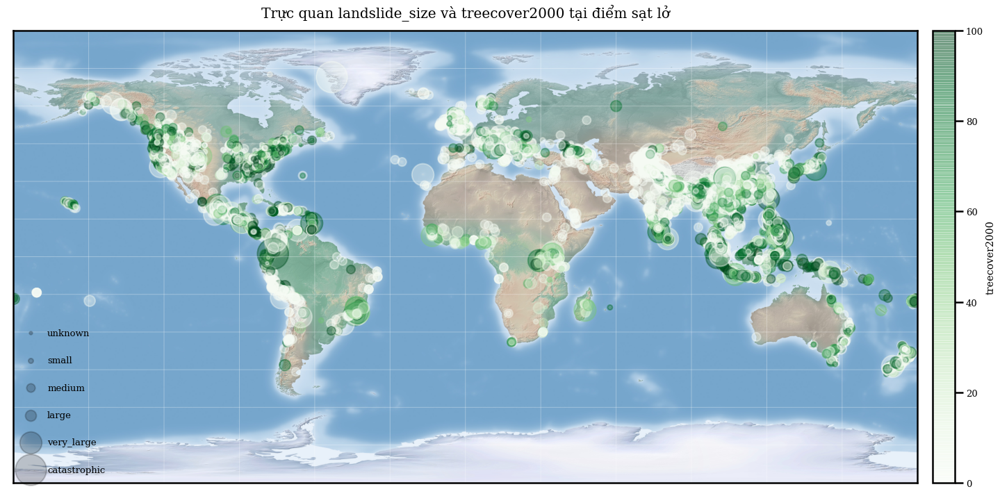

In [ ]:
feature_and_size_map(df,'treecover2000',cmap='Greens',log10_=False)

**Trực quan kích thước sạt lở và độ cao tại điểm sạt lở**

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in log10
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in log10
  # Remove the CWD from sys.path while we load stuff.


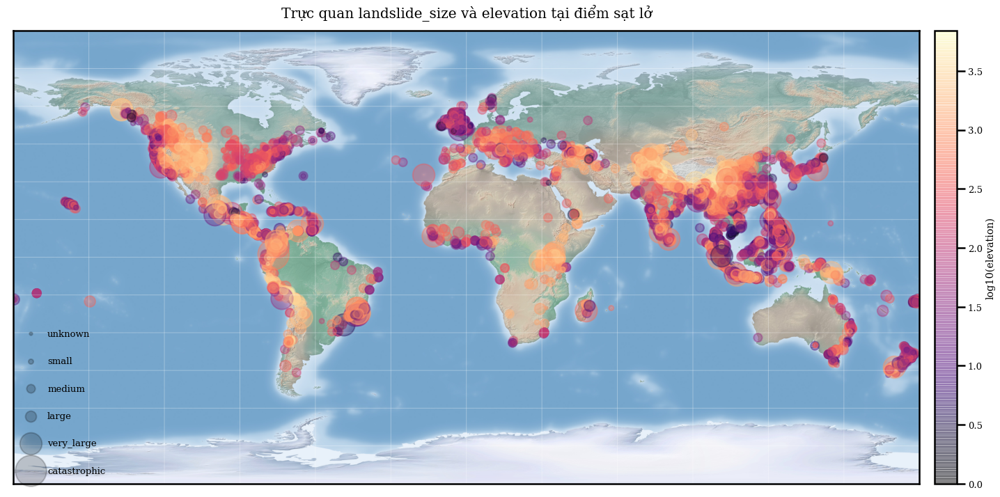

In [ ]:
feature_and_size_map(df,'elevation',cmap='magma',log10_=True)

**Trực quan kích thước sạt lở và lượng mưa tại điểm sạt lở**

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in log10
  # Remove the CWD from sys.path while we load stuff.


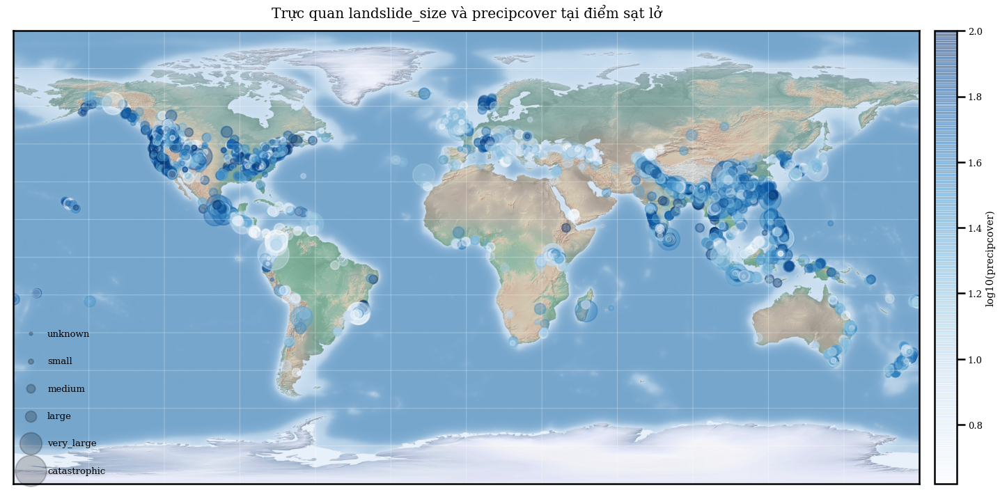

In [ ]:
feature_and_size_map(df,'precipcover',cmap='Blues',log10_=True)

**Trực quan kích thước sạt lở và trung bình mật độ dân số tại điểm sạt lở**

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in log10
  # Remove the CWD from sys.path while we load stuff.


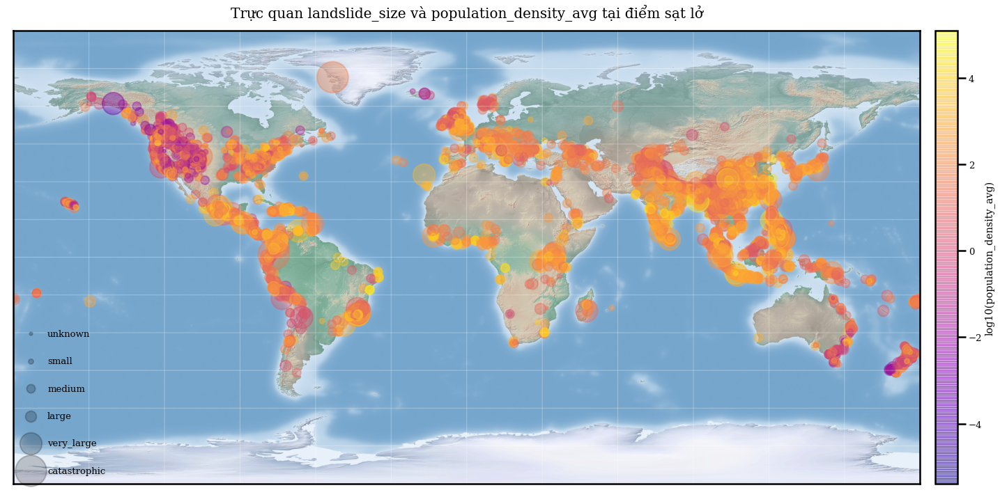

In [ ]:
p_d = ['population_density_2000', 'population_density_2005',
       'population_density_2010', 'population_density_2015',
       'population_density_2020']
tmp = df.copy()
tmp['population_density_avg'] = tmp[p_d].mean(axis=1)

feature_and_size_map(tmp,'population_density_avg',cmap='plasma',log10_=True)

**Trực quan kích thước sạt lở và nguyên nhân gây sạt lở**

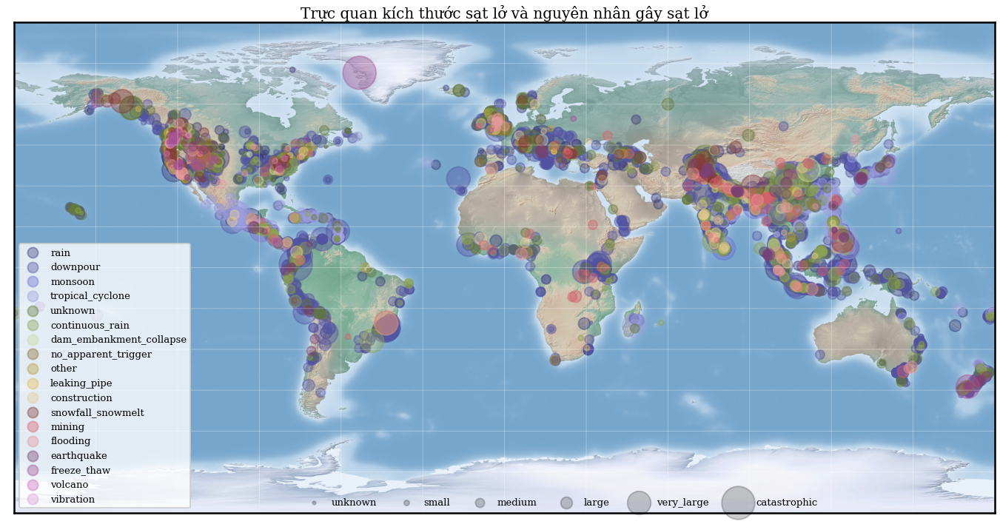

In [ ]:
tmp = df.dropna(subset=['landslide_trigger'])
triggers = tmp.landslide_trigger.unique()

color_list=mcp.gen_color(cmap="tab20b",n=len(triggers))

l = {'unknown':20,'small':50,'medium':150,'large':250,'very_large':1000,'catastrophic':2000}
s_ = [*map(l.get,  df['landslide_size'])]
tmp = df.copy()
tmp['s'] = s_

fig,ax = plt.subplots(figsize=(30, 10), edgecolor='w')

m = Basemap(projection='cyl', resolution=None,
            llcrnrlat=-90, urcrnrlat=90,
            llcrnrlon=-180, urcrnrlon=180, )

draw_map(m,scale=0.3)

for idx,t in enumerate(triggers):
  lat_ = tmp[tmp['landslide_trigger']==t]['latitude']
  lon_ = tmp[tmp['landslide_trigger']==t]['longitude']
  scatter = ax.scatter(lon_, lat_,c=color_list[idx],label=t,alpha=0.4,s=tmp[tmp['landslide_trigger']==t]['s'].values)

leg1 = ax.legend(loc='lower left')
for handle in leg1.legendHandles:
    handle.set_sizes([200.0])

sca = []
for key,val in l.items():
  scatter2 = ax.scatter([], [], c='k', alpha=0.2, s=val,label=key)
  sca.append(scatter2)
  
leg2 = fig.legend(sca,l.keys(),scatterpoints=1, frameon=False,
           labelspacing=2.5, loc=(0.3,0.03),ncol = len(ax.lines));

plt.title('Trực quan kích thước sạt lở và nguyên nhân gây sạt lở',fontsize=20)
plt.tight_layout()
plt.show()


## Text



**Wordcloud những từ xuất hiện nhiều dựa trên 'event_description' tại các thuộc tính**

rain
downpour
monsoon
tropical_cyclone
unknown
continuous_rain
dam_embankment_collapse
no_apparent_trigger
other
leaking_pipe
construction
snowfall_snowmelt
mining
flooding
earthquake
freeze_thaw
volcano
vibration


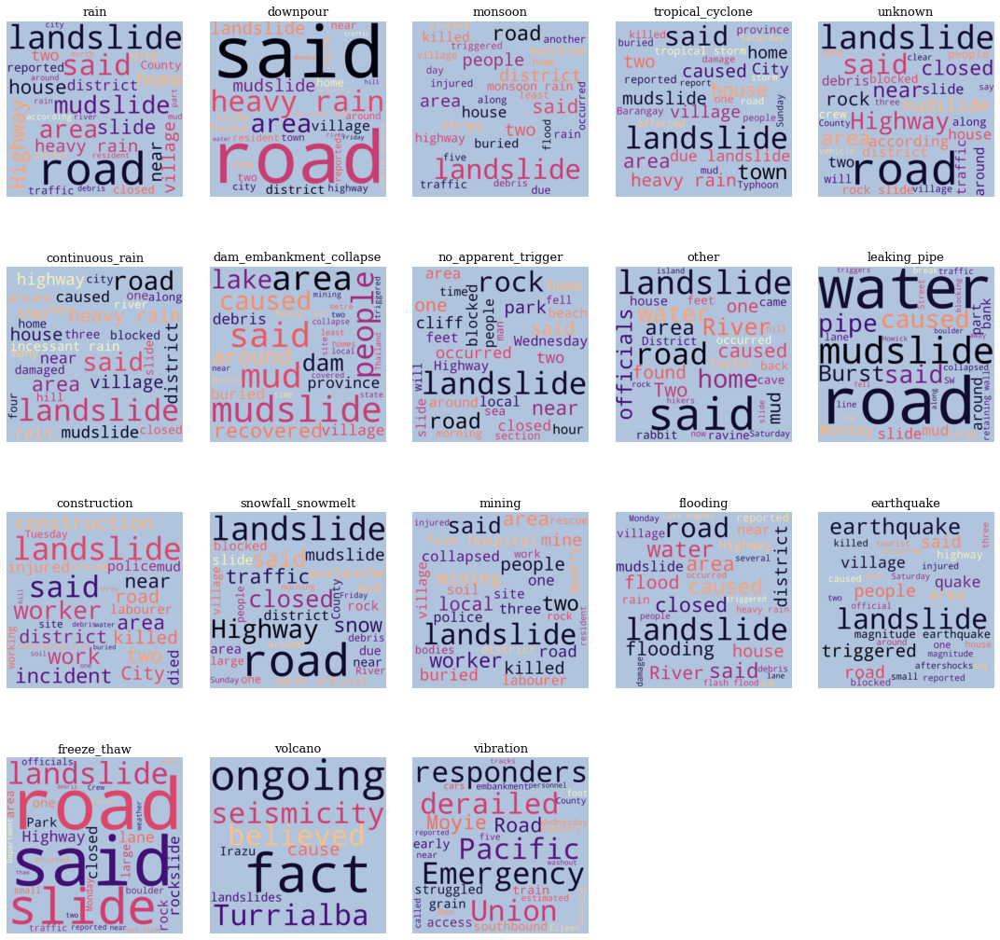

In [ ]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib as mpl
stopwords = set(STOPWORDS)

fig = plt.figure(figsize=(15,15))
tmp1 = df.dropna(subset=['landslide_trigger'])
c=0
for i in tmp1.landslide_trigger.unique():
    print(i)
    tmp = tmp1[tmp1['landslide_trigger']==i]
    text = ' '.join(tmp.dropna(subset=['event_description'])['event_description'].values)
    ax = fig.add_subplot(4,5, c+1)
    c+=1
    #fig = plt.figure(figsize=(7,7))
    ax.set_title(i,fontdict={'fontsize':13})
    wordcloud = WordCloud(min_font_size=8,max_words=30,background_color="lightsteelblue", stopwords=stopwords,width=500,height=500,scale=3,
                colormap=mpl.cm.magma,random_state=42).generate(text)
    ax.imshow(wordcloud,interpolation="bilinear")
    ax.axis('off')
plt.tight_layout()
plt.show()

**Wordcloud những từ xuất hiện nhiều ở các nhãn mức độ sạt lở (target) dựa trên 'event_description'**

In [ ]:
set(df.landslide_size)

{'catastrophic', 'large', 'medium', nan, 'small', 'unknown', 'very_large'}

large
small
medium
unknown
very_large
catastrophic


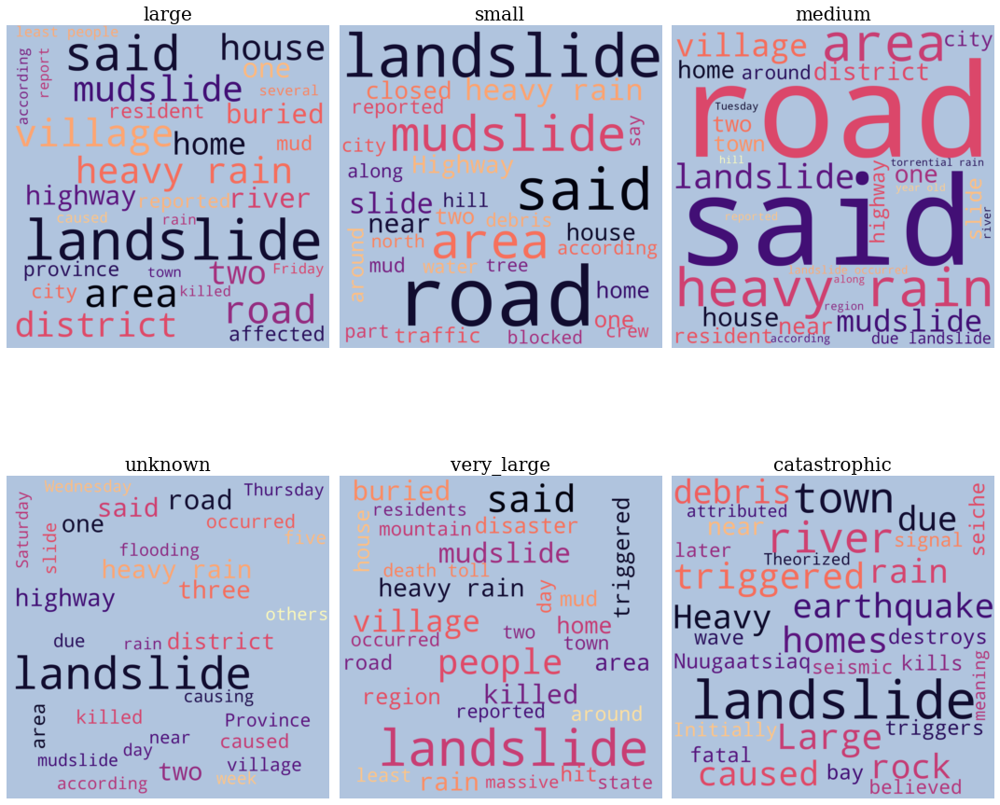

In [ ]:
fig = plt.figure(figsize=(15,15))
tmp1 = df.dropna(subset=['landslide_size'])
c=0
for i in tmp1.landslide_size.unique():
    print(i)
    tmp = tmp1[tmp1['landslide_size']==i]
    text = ' '.join(tmp.dropna(subset=['event_description'])['event_description'].values)
    ax = fig.add_subplot(2,3, c+1)
    c+=1
    #fig = plt.figure(figsize=(7,7))
    ax.set_title(i,fontdict={'fontsize':20})
    wordcloud = WordCloud(min_font_size=8,max_words=30,background_color="lightsteelblue", stopwords=stopwords,width=500,height=500,scale=3,
                colormap=mpl.cm.magma,random_state=42).generate(text)
    ax.imshow(wordcloud,interpolation="bilinear")
    ax.axis('off')
plt.tight_layout()
plt.show()

# **Nhận xét**
- Nguyên nhân gây ra sạt lở đất phần lớn là do mưa, nhiều nhất là 'downpour'.
- Loại sạt lở đất hay gặp nhất là 'landslide' và 'mudslide'.
- Kích thước của một sự kiện sạt lở đất hay gặp là 'medium', kích thước hiếm gặp nhất là 'very_large'.
- Sạt lở đất diễn ra nhiều hơn trong những năm gần trở lại đây (từ 2007 trở đi).
- 'United State' là quốc gia có nhiều sự kiện sạt lở đất diễn ra nhất, theo sau đó là 'India' và 'Philippines'
- Tại United State, sạt lở đất diễn ra nhiều trong giai đoạn từ tháng 12 đến tháng 3, tại India là từ tháng 6 đến tháng 8, tại Vietnam là từ tháng 7 đến tháng 11.
- Nhìn chung mùa hè là mùa thường xuyên xảy ra sạt lở đất nhất.
- North America và Asia là hai châu lục thường xuyên xảy ra sạt lở đất nhất.
- Năm 2010 là năm có nhiều sự kiện sạt lở đất xảy ra, cũng như có nhiều số người tử vong nhất.
- China là quốc gia có số lượng người tử vong do sạt lở đất nhiều nhất, Guatemala và Colombia có số lượng người bị thương do sạt lở đất nhiều nhất. Đặc biệt United States có số lượng sự kiện sạt lở đất nhiều nhất nhưng lại không nằm trong top các quốc gia có số lượng người bị thương/tử vong nhiều.
- ***KHÔNG THẤY CÓ TƯƠNG QUAN GIỮA ĐỘ CAO VÀ SỐ LƯỢNG SỰ KIỆN***
- Độ cao tại khu vực sạt lở càng cao, mức độ sạt lở càng nghiêm trọng
- Sự kiện thảm hoạ:
1. Thảm họa dòng chảy mảnh vỡ (debris_flow) Kedarnath ở Uttarakhand, Ấn Độ (16/06/2013) khiến hơn 5000 người thiệt mạng \\
Độ cao: 3543m
2. Sạt lở đất do mưa kéo dài ở huyện Zhouqu, quận Cam Túc, Trung Quốc (07/08/2010) khiến hon 1765 người thiệt mạng và nhiều người mất tích \\
Độ cao: 1382m
3. Lở đất tại một ngôi làng miền núi hẻo lánh Abi Barik , Afghanistan (02/05/2014) khiến ít nhất 2.100 người được cho là đã chết, bị chôn vùi dưới đống đá và đất. Nguyên nhân chính là mưa lớn kéo dài và tuyết tan. \\
Độ cao: 1873m
